Name: Lete

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
# Dataset can be found from https://data.boston.gov/dataset/crime-incident-reports-august-2015-to-date-source-new-system

In [3]:
crime = pd.read_csv('crime.csv',encoding = "ISO-8859-1")

In [4]:
crime.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


In [5]:
crime.columns = map(str.lower, crime.columns)

In [6]:
crime.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319073 entries, 0 to 319072
Data columns (total 17 columns):
incident_number        319073 non-null object
offense_code           319073 non-null int64
offense_code_group     319073 non-null object
offense_description    319073 non-null object
district               317308 non-null object
reporting_area         319073 non-null object
shooting               1019 non-null object
occurred_on_date       319073 non-null object
year                   319073 non-null int64
month                  319073 non-null int64
day_of_week            319073 non-null object
hour                   319073 non-null int64
ucr_part               318983 non-null object
street                 308202 non-null object
lat                    299074 non-null float64
long                   299074 non-null float64
location               319073 non-null object
dtypes: float64(2), int64(4), object(11)
memory usage: 41.4+ MB


In [7]:
crime.occurred_on_date = pd.to_datetime(crime.occurred_on_date)

In [8]:
crime.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319073 entries, 0 to 319072
Data columns (total 17 columns):
incident_number        319073 non-null object
offense_code           319073 non-null int64
offense_code_group     319073 non-null object
offense_description    319073 non-null object
district               317308 non-null object
reporting_area         319073 non-null object
shooting               1019 non-null object
occurred_on_date       319073 non-null datetime64[ns]
year                   319073 non-null int64
month                  319073 non-null int64
day_of_week            319073 non-null object
hour                   319073 non-null int64
ucr_part               318983 non-null object
street                 308202 non-null object
lat                    299074 non-null float64
long                   299074 non-null float64
location               319073 non-null object
dtypes: datetime64[ns](1), float64(2), int64(4), object(10)
memory usage: 41.4+ MB


In [9]:
crime.offense_code_group.unique()

array(['Larceny', 'Vandalism', 'Towed', 'Investigate Property',
       'Motor Vehicle Accident Response', 'Auto Theft', 'Verbal Disputes',
       'Robbery', 'Fire Related Reports', 'Other', 'Property Lost',
       'Medical Assistance', 'Assembly or Gathering Violations',
       'Larceny From Motor Vehicle', 'Residential Burglary',
       'Simple Assault', 'Restraining Order Violations', 'Violations',
       'Harassment', 'Ballistics', 'Property Found',
       'Police Service Incidents', 'Drug Violation', 'Warrant Arrests',
       'Disorderly Conduct', 'Property Related Damage',
       'Missing Person Reported', 'Investigate Person', 'Fraud',
       'Aggravated Assault', 'License Plate Related Incidents',
       'Firearm Violations', 'Other Burglary', 'Arson', 'Bomb Hoax',
       'Harbor Related Incidents', 'Counterfeiting', 'Liquor Violation',
       'Firearm Discovery', 'Landlord/Tenant Disputes',
       'Missing Person Located', 'Auto Theft Recovery', 'Service',
       'Operating Und

In [10]:
crime.offense_code_group.value_counts()

Motor Vehicle Accident Response              37132
Larceny                                      25935
Medical Assistance                           23540
Investigate Person                           18750
Other                                        18075
Drug Violation                               16548
Simple Assault                               15826
Vandalism                                    15415
Verbal Disputes                              13099
Towed                                        11287
Investigate Property                         11124
Larceny From Motor Vehicle                   10847
Property Lost                                 9751
Warrant Arrests                               8407
Aggravated Assault                            7807
Violations                                    6095
Fraud                                         5829
Residential Burglary                          5606
Missing Person Located                        4958
Auto Theft                     

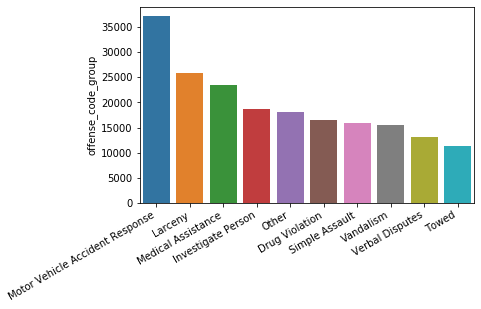

In [11]:
fig = plt.figure()
sns.barplot(x=crime.offense_code_group.value_counts().to_frame().index[:10], y = 'offense_code_group',data =crime.offense_code_group.value_counts().to_frame().head(10) )
fig.autofmt_xdate()

-Although the dataset considers "Motor Vehicle Accident Response" as a crime, which is true in circumstances such as hit and run, drunking driving, lack of driver's license etc., I think this is generally less neighborhood specific (we can in fact check this later). The neightborhood of Boston which has more traffic circiulation will most likely also has an increased incident of this crime. However, this does not indicate that that particular neighborhood is a bad neighborhood. 

-For the above reason, I am more interested to investigate larceny, drug violation, simple assault, vandalism, arrest. These are probably better indication of problematic neighborhoods

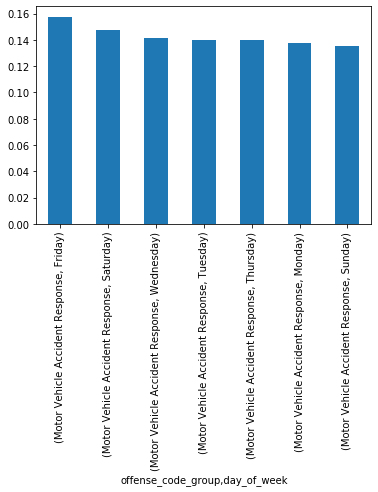

In [12]:
crime[crime.offense_code_group =='Motor Vehicle Accident Response'].groupby('offense_code_group')['day_of_week'].value_counts(normalize = True).plot.bar() 

-Car accidents occur slight more on Friday compared to the other days of the week

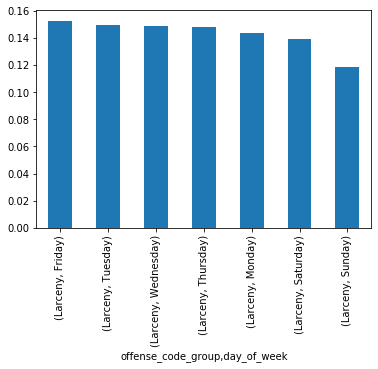

In [13]:
crime[crime.offense_code_group =='Larceny'].groupby('offense_code_group')['day_of_week'].value_counts(normalize = True).plot.bar() 

-It appears that slightly less larceny is commited on Sunday. Apparently thiefs do relax too 

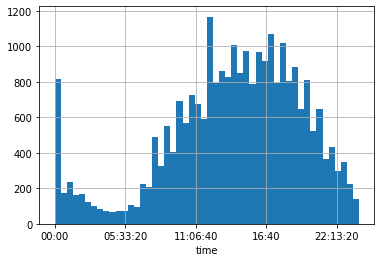

In [14]:
crime[crime.offense_code_group =='Larceny'].occurred_on_date.dt.time.hist(bins = 50)

It seems like most larceny is commited in the afternoon, with another spike around midnight.


In [15]:
crime.head()

,incident_number,offense_code,offense_code_group,offense_description,district,reporting_area,shooting,occurred_on_date,year,month,day_of_week,hour,ucr_part,street,lat,long,location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


In [16]:
import folium


In [17]:
#Setting up base Boston Map
m = folium.Map(location = [42.3601,-71.0589], width = 750, height = 500,  zoom_start = 11,
                  min_zoom = 11)

In [18]:
m

## Larceny Problematic Areas

In [19]:
from folium.plugins import HeatMap

In [20]:
crime_larceny = crime[crime.offense_code_group == 'Larceny']

In [21]:
m = folium.Map(location = [42.3601,-71.0589], width = 750, height = 500,  zoom_start = 11,
                  min_zoom = 2)

HeatMap(crime_larceny[['lat','long']].dropna(), min_opacity = 0.5, radius = 11 ).add_to(m)
m

It appears that larceny is more concentrated in the northern neighborhood of Boston. This indicates that the south of Boston is generally safer.

## Drug Violation Problematic areas

In [22]:
m2 = folium.Map(location = [42.3601,-71.0589], width = 750, height = 500,  zoom_start = 11,
                  min_zoom = 2)

HeatMap(crime[crime.offense_code_group == 'Drug Violation'][['lat','long']].dropna(), min_opacity = 0.3, radius = 12 ).add_to(m2)
m2

-Drug violation is concentrated in the 'Financial District' and 'South End' of Boston

In [23]:
m3 = folium.Map(location = [42.3601,-71.0589], width = 750, height = 500,  zoom_start = 11,
                  min_zoom = 2)

HeatMap(crime[crime.offense_code_group == 'Homicide'][['lat','long']].dropna(), min_opacity = 0.9, radius = 12 ).add_to(m3)
m3

- Homicide seems to be more concentrated in the center of Boston

In [24]:
crime_drug = crime[crime.offense_code_group == 'Drug Violation'].groupby([crime.occurred_on_date.dt.year,crime.occurred_on_date.dt.month]).incident_number.count()

In [25]:
crime_drug = crime_drug.unstack(0)

In [26]:
crime_drug.index.name = 'month'
crime_drug.columns.name = 'year'

In [27]:
crime_drug = crime_drug.reset_index().melt(id_vars = 'month', value_name='count')
crime_drug.head()

,month,year,count
0,1,2015,NaN
1,2,2015,NaN
2,3,2015,NaN
3,4,2015,NaN
4,5,2015,NaN


In [28]:
crime_drug.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48 entries, 0 to 47
Data columns (total 3 columns):
month    48 non-null int64
year     48 non-null object
count    40 non-null float64
dtypes: float64(1), int64(1), object(1)
memory usage: 1.2+ KB


In [29]:
crime_drug.year = crime_drug.year.astype('int64')
crime_drug.month = crime_drug.month.astype('int64')

Text(0.5, 1.0, 'Drug Violations by month and year')

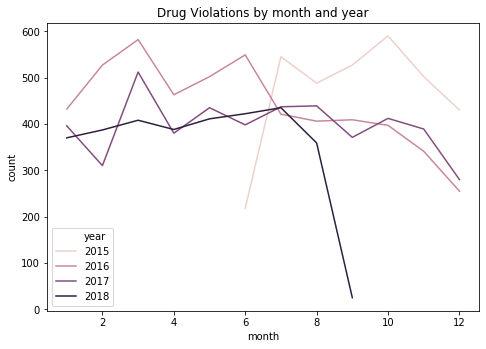

In [30]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
sns.lineplot(x = 'month', y = 'count', hue='year', data = crime_drug)
ax.set_title('Drug Violations by month and year')

In [31]:
crime.occurred_on_date.max()

Timestamp('2018-09-03 21:25:00')

- Note that we cannot interpret the last month of 2018, since the end date is not the end of the month"
- With the same line of reasoning, we cannot interpret the first month of 2015

Overall, drug violations seem to be stable across months and years in Boston

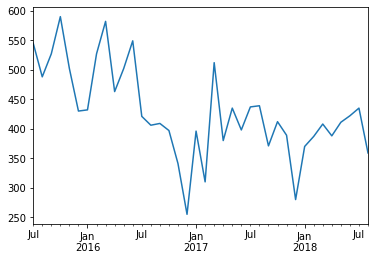

In [32]:
crime[crime.offense_code_group == 'Drug Violation'].occurred_on_date.dt.to_period('M').value_counts().sort_index()[1:-1].plot()

-The number of drug related violations seem to be steadily falling over the years

-  There are many potential explanation for the decline in drug violations. It could be that people indeed use less illicit substances, or it could be that police are more tolerant on drugs (e.g. marijuana legalization). We cannot know for sure without more extensive data

Text(0.5, 1.0, 'Frequency drug violation: time of day')

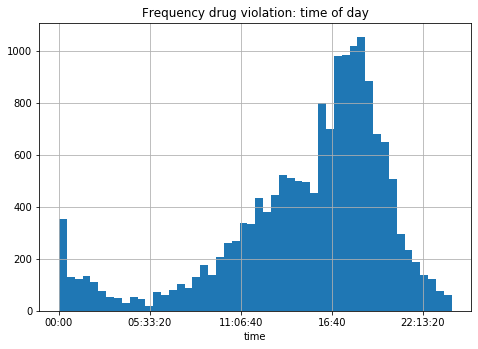

In [33]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
crime[crime.offense_code_group == 'Drug Violation'].occurred_on_date.dt.time.hist(bins = 50)
ax.set_title('Frequency drug violation: time of day')

In [34]:
cross_tab = pd.crosstab(crime.occurred_on_date.dt.year, crime.offense_code_group)
cross_tab

offense_code_group,Aggravated Assault,Aircraft,Arson,Assembly or Gathering Violations,Auto Theft,Auto Theft Recovery,Ballistics,Biological Threat,Bomb Hoax,Burglary - No Property Taken,...,Restraining Order Violations,Robbery,Search Warrants,Service,Simple Assault,Towed,Vandalism,Verbal Disputes,Violations,Warrant Arrests
occurred_on_date,,,,,,,,,,,,,,,,,,,,,
2015,1386,4,11,240,988,137,166,0,17,1,...,247,948,166,59,2612,1559,2701,1509,1354,1319
2016,2365,4,34,333,1537,312,303,0,38,1,...,532,1506,293,82,4740,3223,5063,4099,1923,2837
2017,2404,22,32,243,1393,371,339,2,11,0,...,522,1376,347,88,4896,3951,4837,4436,1614,3098
2018,1652,6,17,139,933,231,173,0,9,0,...,306,794,160,56,3578,2554,2814,3055,1204,1153


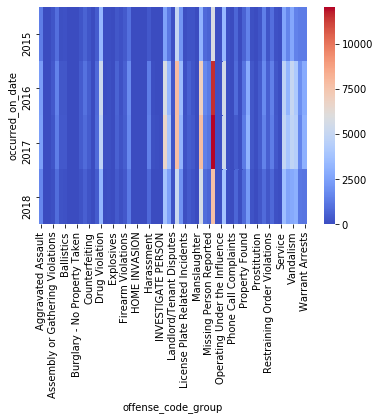

In [35]:
sns.heatmap(cross_tab, cmap='coolwarm')

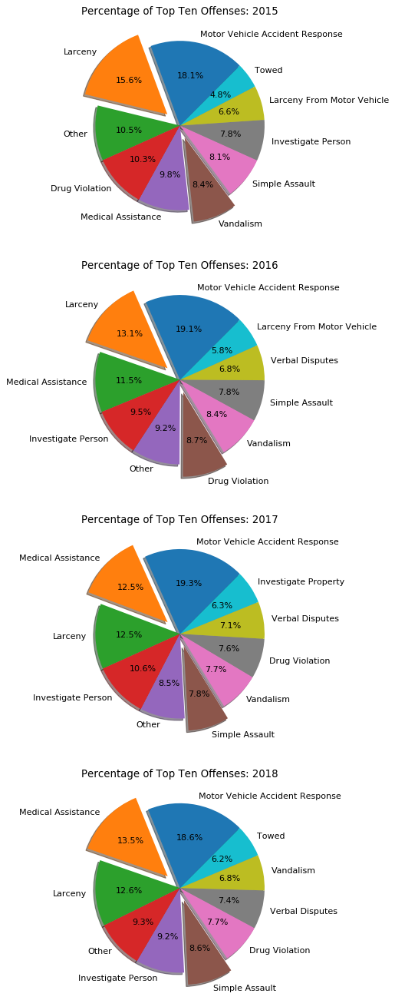

In [36]:
explode = (0, 0.2, 0, 0,0,0.15,0,0,0,0) 
fig1,ax1 = plt.subplots(4,1, figsize = (36,21), dpi =80)
t= 0
for year in [2015,2016,2017,2018]:
        ax1[t].pie(cross_tab.loc[year].sort_values(ascending = False)[:10],
        autopct='%1.1f%%', explode = explode, startangle=45, shadow = True,labels = cross_tab.loc[year].sort_values(ascending = False).index[:10])
        ax1[t].set_title('Percentage of Top Ten Offenses: ' + str(year))
        t += 1


In [37]:
crime_non_motor = crime[crime.offense_code_group != 'Motor Vehicle Accident Response']

In [38]:
m4 = folium.Map(location = [42.3601,-71.0589], width = 750, height = 500,  zoom_start = 11,
                  min_zoom = 2)

HeatMap(crime_non_motor[['lat','long']].dropna(), min_opacity = 0.3, radius = 10 ).add_to(m4)
m4

-When we take into account of all type of offenses excluding motor accient and not just drug violations and larceny, it appears that crimes are pretty spread out Boston. This conveys that even good neighborhoods are not immune to crimes, although their severity may be lower.

In [39]:
crime_non_motor.head()

,incident_number,offense_code,offense_code_group,offense_description,district,reporting_area,shooting,occurred_on_date,year,month,day_of_week,hour,ucr_part,street,lat,long,location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


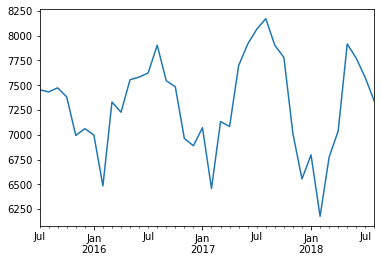

In [40]:
fig = plt.figure()
crime_non_motor.occurred_on_date.dt.to_period('M').value_counts().sort_index()[1:-1].plot()

-There is somekind of seasonality to the number of crimes (excluding motor accidents related crimes)

-Perhaps law offenders also do take holidays, especially during Christmas and New Year

-Overall, there does not seem to be a reduction in the number of crimes over the years (the peak gets higher while the trough gets lower)

In [41]:
crime.head()

,incident_number,offense_code,offense_code_group,offense_description,district,reporting_area,shooting,occurred_on_date,year,month,day_of_week,hour,ucr_part,street,lat,long,location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


In [42]:
crime.lat.min() #Dirty data


-1.0

In [43]:
crime.lat.replace(-1.0, np.nan, inplace = True)

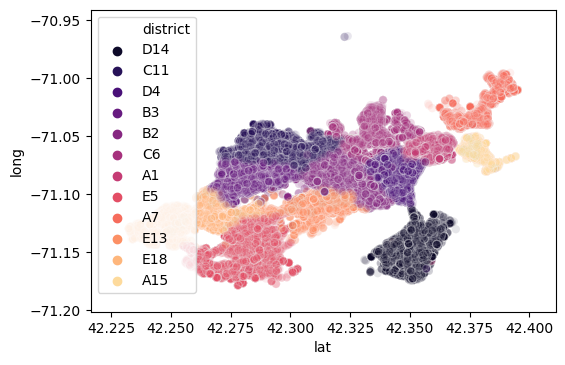

In [50]:
fig = plt.figure(dpi = 100)
sns.scatterplot(x = 'lat',y='long', data = crime, hue = 'district' ,alpha =0.1,palette = 'magma')


In [45]:
offenses_monthly = crime[['occurred_on_date','offense_code_group']].groupby([crime.occurred_on_date.dt.year,crime.occurred_on_date.dt.month]).offense_code_group.value_counts()

In [46]:
offenses_monthly.unstack(2).head(10)

offense_code_group                 Aggravated Assault  Aircraft  Arson  \
occurred_on_date occurred_on_date                                        
2015             6                              124.0       NaN    1.0   
                 7                              245.0       NaN    NaN   
                 8                              221.0       1.0    1.0   
                 9                              234.0       NaN    4.0   
                 10                             172.0       NaN    3.0   
                 11                             204.0       NaN    2.0   
                 12                             186.0       3.0    NaN   
2016             1                              175.0       1.0    2.0   
                 2                              163.0       NaN    2.0   
                 3                              166.0       NaN    5.0   

offense_code_group                 Assembly or Gathering Violations  \
occurred_on_date occurred_on_date                                     
2015             6                                             15.0   
                 7                                             21.0   
                 8                                             22.0   
                 9                                             66.0   
                 10                                            53.0   
                 11                                            40.0   
                 12                                            23.0   
2016             1                                             27.0   
                 2                                             32.0   
                 3                                             23.0   

offense_code_group                 Auto Theft  Auto Theft Recovery  \
occurred_on_date occurred_on_date                                    
2015             6                       66.0                  8.0   
                 7                      178.0                 24.0   
                 8                      166.0                 22.0   
                 9                      206.0                 21.0   
                 10                     140.0                 23.0   
                 11                     112.0                 18.0   
                 12                     120.0                 21.0   
2016             1                      103.0                 25.0   
                 2                      103.0                 25.0   
                 3                       99.0                 32.0   

offense_code_group                 Ballistics  Biological Threat  Bomb Hoax  \
occurred_on_date occurred_on_date                                             
2015             6                       12.0                NaN        2.0   
                 7                       31.0                NaN        2.0   
                 8                       29.0                NaN        3.0   
                 9                       34.0                NaN        1.0   
                 10                      15.0                NaN        2.0   
                 11                      20.0                NaN        3.0   
                 12                      25.0                NaN        4.0   
2016             1                       21.0                NaN        5.0   
                 2                       12.0                NaN       10.0   
                 3                       16.0                NaN        7.0   

offense_code_group                 Burglary - No Property Taken  ...  \
occurred_on_date occurred_on_date                                ...   
2015             6                                          NaN  ...   
                 7                                          NaN  ...   
                 8                                          NaN  ...   
                 9                                          NaN  ...   
                 10                 

In [47]:
monthly_offenses_corr = offenses_monthly.unstack(2).corr()
monthly_offenses_corr

offense_code_group,Aggravated Assault,Aircraft,Arson,Assembly or Gathering Violations,Auto Theft,Auto Theft Recovery,Ballistics,Biological Threat,Bomb Hoax,Burglary - No Property Taken,...,Restraining Order Violations,Robbery,Search Warrants,Service,Simple Assault,Towed,Vandalism,Verbal Disputes,Violations,Warrant Arrests
offense_code_group,,,,,,,,,,,,,,,,,,,,,
Aggravated Assault,1.000000,0.197856,0.334876,0.179789,0.778544,0.508070,0.749598,NaN,-0.097301,NaN,...,0.542987,0.545853,-0.114196,0.647373,0.818880,0.646590,0.733916,0.610349,0.570091,0.546707
Aircraft,0.197856,1.000000,0.611500,-0.014626,0.032810,0.371698,0.231464,NaN,-0.196118,NaN,...,0.220861,-0.059627,0.177980,0.221199,0.175146,0.410663,0.322507,0.317306,0.130839,0.492591
Arson,0.334876,0.611500,1.000000,-0.021627,0.357647,0.494079,0.242319,NaN,0.047801,NaN,...,0.228689,0.193753,0.018308,0.285662,0.350809,0.308141,0.272039,0.272948,0.228773,0.265792
Assembly or Gathering Violations,0.179789,-0.014626,-0.021627,1.000000,0.297279,-0.056874,0.186354,NaN,0.116937,NaN,...,0.175134,0.501913,0.207035,0.101816,0.105124,-0.041496,0.294597,-0.198543,0.526344,0.184967
Auto Theft,0.778544,0.032810,0.357647,0.297279,1.000000,0.292921,0.699820,NaN,0.030053,NaN,...,0.403533,0.624127,-0.098787,0.710565,0.640094,0.394617,0.685835,0.338603,0.623532,0.466764
Auto Theft Recovery,0.508070,0.371698,0.494079,-0.056874,0.292921,1.000000,0.357888,NaN,-0.007615,NaN,...,0.534913,0.272614,0.254670,0.289973,0.658875,0.642662,0.482056,0.753967,0.176834,0.480378
Ballistics,0.749598,0.231464,0.242319,0.186354,0.699820,0.357888,1.000000,NaN,-0.211961,NaN,...,0.454636,0.516913,0.086981,0.554812,0.524177,0.527281,0.622037,0.480371,0.217736,0.629865
Biological Threat,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Bomb Hoax,-0.097301,-0.196118,0.047801,0.116937,0.030053,-0.007615,-0.211961,NaN,1.000000,NaN,...,-0.235133,0.152487,-0.027077,-0.005730,-0.040430,-0.298624,0.165729,-0.089056,0.328433,0.001745


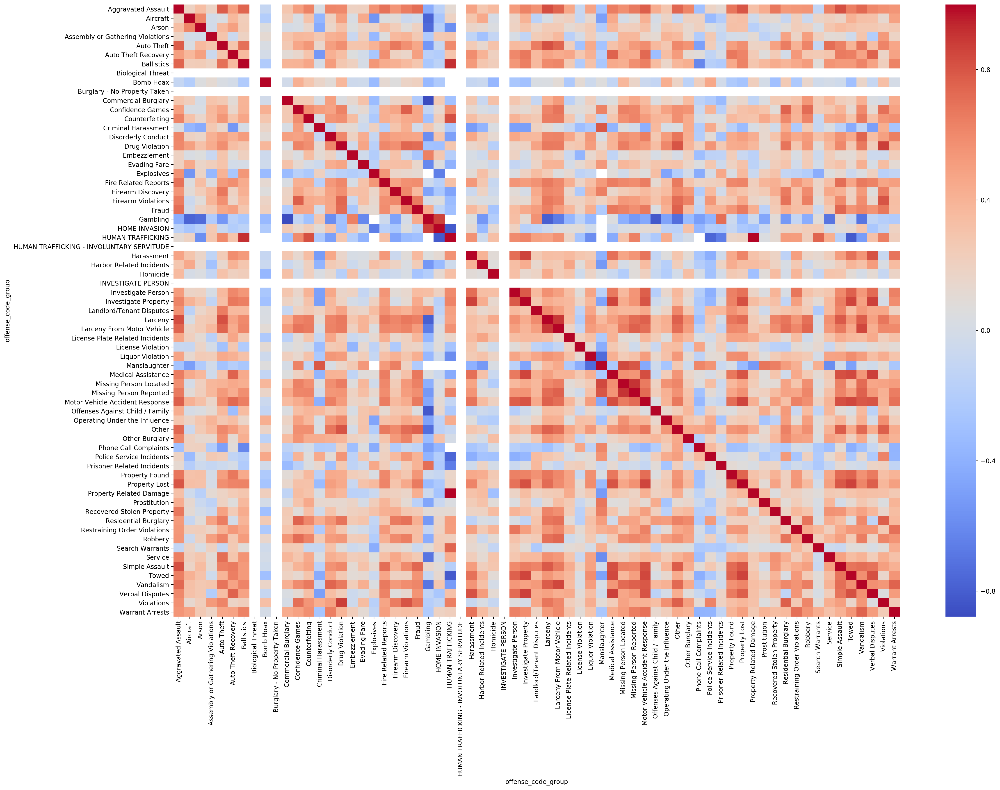

In [48]:
fig = plt.figure(figsize=(26,18), dpi =200)
sns.heatmap(monthly_offenses_corr, cmap = 'coolwarm')

We know that certain crimes are highly correlated. For instance, auto theft is correlated with aggravated assualt. Without further information, we cannot directly say, for example, that the auto thiefs assault the drivers if the drivers do not hand over the keys willingly. You get the drift. An auto thief might you force when necessary to get away. 

Ballistic is also highly correlated with human trafficking. If a lot of ballistics are observed, one may infer that there is a lot of human trafficking also invovled. This is not too far-fetched because human trafficking is often run by organized crimes.

Property related damage is highly correlated with human trafficking. This could just be spurious, or it could mean that organized crimes destroy properties to eliminate evidence or to threaten human traffic victims if they disobey

Strangely enough, human trafficking is not correlated with prostitution in Boston. Human traffic victims may be involved in other kind of labor.